Build Brand Delights/Disappointment maps using Social Media Data:

Dataset: Amazon Product Reviews Dataset from Kaggle



Load Data

In [ ]:
import pandas as pd

In [3]:
df=pd.read_csv('Amazon_Reviews_dataset_Kaggle.csv')

In [5]:
print(df.shape)
df.head()


(1597, 27)


,id,asins,brand,categories,colors,dateAdded,dateUpdated,dimension,ean,keys,...,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sizes,upc,weight
0,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,...,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I initially had trouble deciding between the p...,"Paperwhite voyage, no regrets!",NaN,NaN,Cristina M,NaN,NaN,205 grams
1,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,...,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,Allow me to preface this with a little history...,One Simply Could Not Ask For More,NaN,NaN,Ricky,NaN,NaN,205 grams
2,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,...,4.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I am enjoying it so far. Great for reading. Ha...,Great for those that just want an e-reader,NaN,NaN,Tedd Gardiner,NaN,NaN,205 grams
3,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,...,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I bought one of the first Paperwhites and have...,Love / Hate relationship,NaN,NaN,Dougal,NaN,NaN,205 grams
4,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,...,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I have to say upfront - I don't like coroporat...,I LOVE IT,NaN,NaN,Miljan David Tanic,NaN,NaN,205 grams


In [14]:
# Count distinct brand names
distinct_brands = df['brand'].nunique()
print(f"Number of distinct brands: {distinct_brands}")

Number of distinct brands: 2


In [7]:
# Review text and title pre-processing
print(df['reviews.text'].head())
print(df['reviews.title'].head())
df['reviews.text.clean'] = df['reviews.text'].str.replace(r'[^\w\s]', '', regex=True).str.replace(r'\d+', '', regex=True).str.lower()
df['reviews.title.clean'] = df['reviews.title'].str.replace(r'[^\w\s]', '', regex=True).str.replace(r'\d+', '', regex=True).str.lower()

0    I initially had trouble deciding between the p...
1    Allow me to preface this with a little history...
2    I am enjoying it so far. Great for reading. Ha...
3    I bought one of the first Paperwhites and have...
4    I have to say upfront - I don't like coroporat...
Name: reviews.text, dtype: object
0                Paperwhite voyage, no regrets!
1             One Simply Could Not Ask For More
2    Great for those that just want an e-reader
3                      Love / Hate relationship
4                                     I LOVE IT
Name: reviews.title, dtype: object


In [11]:
# Generate Document-Term-Frequency matrices (either TFIDF) after pre-processing data for stop word removal, special character removal, number removal, and case conversion.
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', lowercase=True, token_pattern=r'\b\w+\b')

df['reviews.text.clean'] = df['reviews.text.clean'].fillna('').astype(str)
df['reviews.title.clean'] = df['reviews.title.clean'].fillna('').astype(str)

tfidf_matrix_text = tfidf_vectorizer.fit_transform(df['reviews.text.clean'])
tfidf_matrix_title = tfidf_vectorizer.fit_transform(df['reviews.title.clean'])



In [15]:
# Check available columns and sample data
print("Columns:", df.columns.tolist())
print("\nDataset info:")
print(df.info())
print("\nBrand value counts:")
print(df['brand'].value_counts())

Columns: ['id', 'asins', 'brand', 'categories', 'colors', 'dateAdded', 'dateUpdated', 'dimension', 'ean', 'keys', 'manufacturer', 'manufacturerNumber', 'name', 'prices', 'reviews.date', 'reviews.doRecommend', 'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs', 'reviews.text', 'reviews.title', 'reviews.userCity', 'reviews.userProvince', 'reviews.username', 'sizes', 'upc', 'weight', 'reviews.text.clean', 'reviews.title.clean']

Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1597 entries, 0 to 1596
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    1597 non-null   object 
 1   asins                 1597 non-null   object 
 2   brand                 1597 non-null   object 
 3   categories            1597 non-null   object 
 4   colors                774 non-null    object 
 5   dateAdded             1597 non-null   object 
 6   dateUpdated           1597

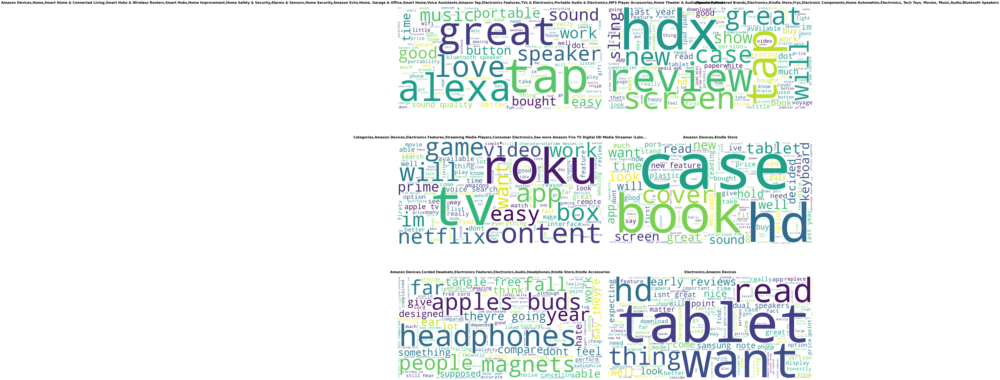

In [19]:
# Build word clouds based on 'reviews.title.clean' and 'reviews.text.clean' 

import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import math

# Top categories to visualize (using categories instead of brand since brand has only 2 values)
top_categories = df['categories'].fillna('Unknown').value_counts().head(6).index.tolist()

# Optional custom stopwords
custom_stopwords = set(STOPWORDS).union({'amazon', 'kindle', 'fire', 'echo', 'product', 'device', 'one', 'get', 'use', 'using'})

n_cols = 2
n_rows = math.ceil(len(top_categories) / n_cols)
plt.figure(figsize=(12 * n_rows, 12 * n_rows), dpi=100)

for i, category in enumerate(top_categories, 1):
    
    # Combine all cleaned review text for this category
    text = " ".join(df[df['categories'] == category]['reviews.text.clean'].dropna().astype(str))
    
    # Avoid empty-text error
    if not text.strip():
        text = "no reviews"
    
    # Generate word cloud with better styling
    wordcloud = WordCloud(
        width=1600,
        height=800,
        background_color='white',
        stopwords=custom_stopwords,
        colormap='viridis',
        max_words=150,
        relative_scaling=0.5,
        min_font_size=10
    ).generate(text)
    
    # Plot
    plt.subplot(n_rows, n_cols, i)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"{category}", fontsize=20, fontweight='bold', pad=20)
    plt.axis('off')

plt.tight_layout(pad=3.0)
plt.show()

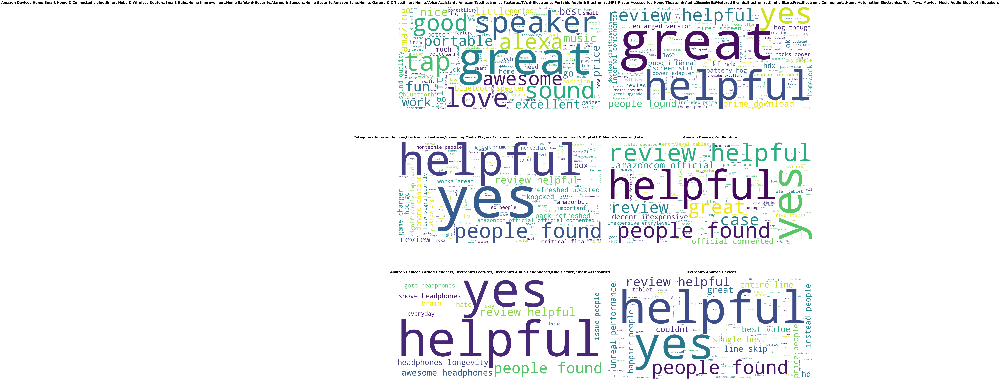

In [20]:
# Build word clouds based on 'reviews.title.clean' and 'reviews.title.clean' 

import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import math

# Top categories to visualize (using categories instead of brand since brand has only 2 values)
top_categories = df['categories'].fillna('Unknown').value_counts().head(6).index.tolist()

# Optional custom stopwords
custom_stopwords = set(STOPWORDS).union({'amazon', 'kindle', 'fire', 'echo', 'product', 'device', 'one', 'get', 'use', 'using'})

n_cols = 2
n_rows = math.ceil(len(top_categories) / n_cols)
plt.figure(figsize=(12 * n_rows, 12 * n_rows), dpi=100)

for i, category in enumerate(top_categories, 1):
    
    # Combine all cleaned review text for this category
    text = " ".join(df[df['categories'] == category]['reviews.title.clean'].dropna().astype(str))
    
    # Avoid empty-text error
    if not text.strip():
        text = "no reviews"
    
    # Generate word cloud with better styling
    wordcloud = WordCloud(
        width=1600,
        height=800,
        background_color='white',
        stopwords=custom_stopwords,
        colormap='viridis',
        max_words=150,
        relative_scaling=0.5,
        min_font_size=10
    ).generate(text)
    
    # Plot
    plt.subplot(n_rows, n_cols, i)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"{category}", fontsize=20, fontweight='bold', pad=20)
    plt.axis('off')

plt.tight_layout(pad=3.0)
plt.show()

In [1]:
# Generate Wordclouds for each of the Brands separately. Do they reveal anything? Summarize insights.
# Build word clouds based on 'reviews.title.clean' and 'reviews.text.clean' 

import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import math

# Top brands to visualize (using brands instead of categories since categories has only 2 values)
top_brands = df['brand'].fillna('Unknown').value_counts().head(6).index.tolist()

# Optional custom stopwords
custom_stopwords = set(STOPWORDS).union({'amazon', 'product', 'device', 'one', 'get', 'use', 'using'})

n_cols = 2
n_rows = math.ceil(len(top_brands) / n_cols)
plt.figure(figsize=(12 * n_rows, 12 * n_rows), dpi=100)

for i, brand in enumerate(top_brands, 1):
    
    # Combine all cleaned review text for this brand
    text = " ".join(df[df['brand'] == brand]['reviews.text.clean'].dropna().astype(str))
    
    # Avoid empty-text error
    if not text.strip():
        text = "no reviews"
    
    # Generate word cloud with better styling
    wordcloud = WordCloud(
        width=1600,
        height=800,
        background_color='white',
        stopwords=custom_stopwords,
        colormap='viridis',
        max_words=150,
        relative_scaling=0.5,
        min_font_size=10
    ).generate(text)
    
    # Plot
    plt.subplot(n_rows, n_cols, i)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"{brand}", fontsize=20, fontweight='bold', pad=20)
    plt.axis('off')

plt.tight_layout(pad=3.0)
plt.show()


NameError: name 'df' is not defined

In [ ]:
# Perform Topic modeling via Latent Dirchlet Allocation (LDA) on the TF-IDF matrix.   Extract and Interpret the topics. Are they Brand specific?


In [ ]:
# Perform K-means clustering of documents, using terms as variables. Extract 3-5 clusters. Using the cluster means, interpret the topics represented by the clusters.

Generate Document-Term-Frequency matrices (either TFIDF) after pre-processing data for stop word removal, special character removal, number removal, and case conversion.

Generate Wordclouds for each of the Brands separately. Do they reveal anything? Summarize insights.

Perform Topic modeling via Latent Dirchlet Allocation (LDA) on the TF-IDF matrix.   Extract and Interpret the topics. Are they Brand specific?

Perform K-means clustering of documents, using terms as variables. Extract 3-5 clusters. Using the cluster means, interpret the topics represented by the clusters.

Can you generate a Brand Map from your analysis? Can you generate a list of Delighters/Disappointers for leading Brands in the category? If not – state the limitations of the analysis.

What are the sampling limitations of this approach?

Should this approach be relied upon to produce Product Positioning maps (Brand Maps)? Will the resulting Brand Map represent the "true" Brand Health?

Should this approach be relied upon to produce Brand Delighters and Disappointers for Brands?

Will the results be reliable?